In [1]:
import os, glob
import json
import tqdm
import pickle #This library will maintain the format as well
import importlib
import radiometric_calib_utils
import mutils
import extract_spectral
import algorithms.Hedley
import algorithms.SUGAR
import algorithms.validate_algorithm
importlib.reload(radiometric_calib_utils)
importlib.reload(mutils)
importlib.reload(extract_spectral)
importlib.reload(algorithms.Hedley)
importlib.reload(algorithms.SUGAR)
importlib.reload(algorithms.validate_algorithm)
from PIL import Image
import radiometric_calib_utils as rcu
import mutils
import extract_spectral as espect
import algorithms.Hedley as Hedley
import algorithms.SUGAR as sugar
import algorithms.validate_algorithm as ValidateAlgo
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from math import ceil
from scipy import ndimage
from scipy.optimize import minimize_scalar
import scipy
# from sklearn.linear_model import LinearRegression
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cv2

# Conduct SUGAR on simulated images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


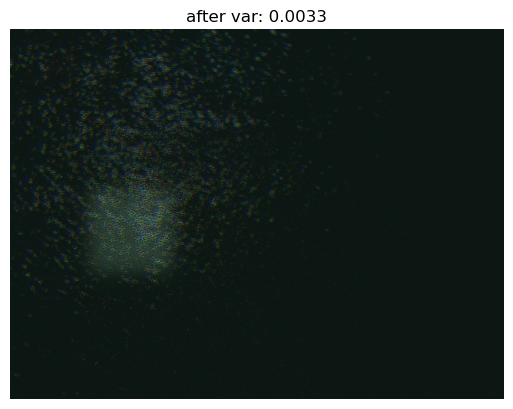

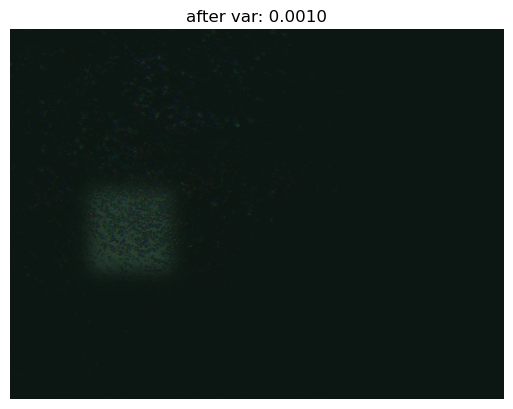

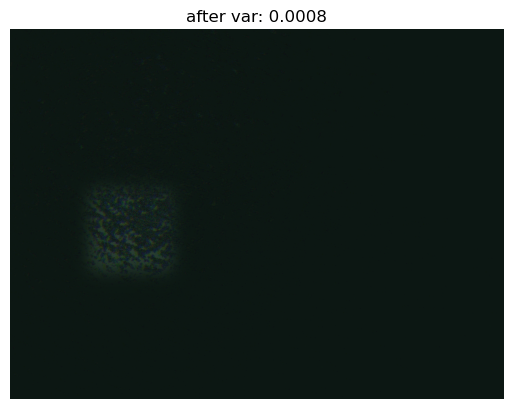

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


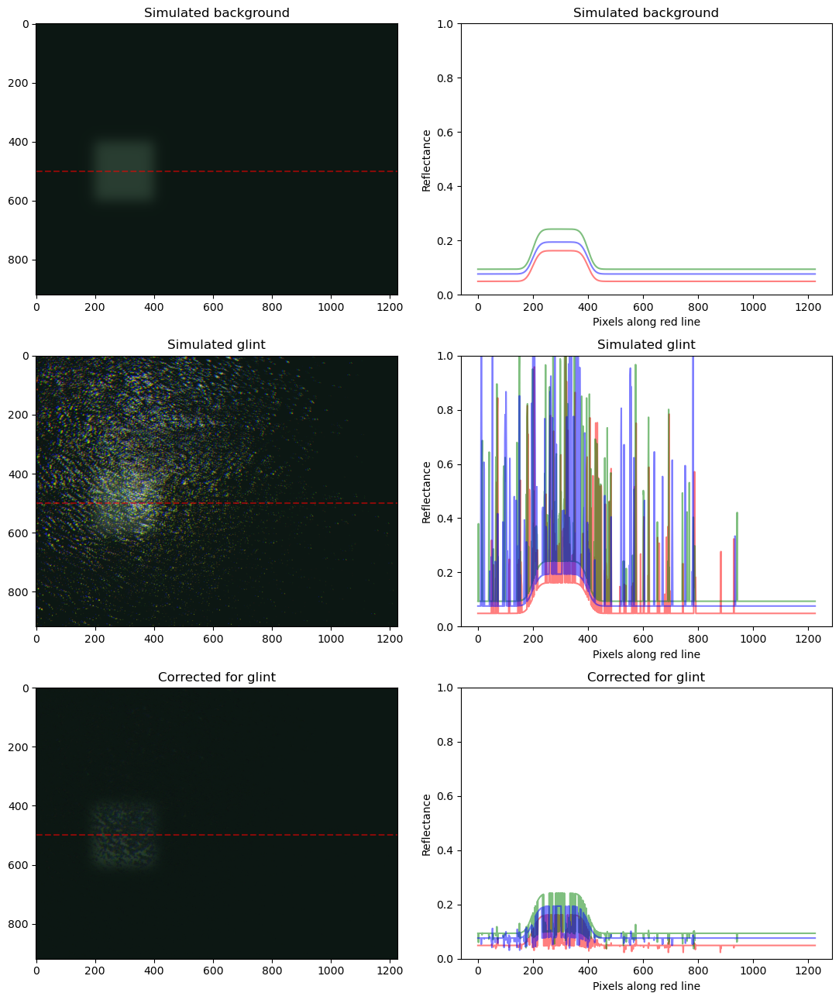

In [12]:
SB = ValidateAlgo.SimulateBackground(background_fp = r"database_turbid\turbid-10thSur24Aug_F1_RawImg_IMG_0043_1.ob",
                                     turbid_fp=r"database_water\water_glint-8thSur11Aug_F3_RawImg_IMG_0198_1.ob",
                                     glint_fp=r"database_glint\example.ob",
                                     bboxes_list=[((200,400),(400,600))],
                                     estimate_background = False,
                                     y_line = 500,x_range=None)
im_list = SB.simulation()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


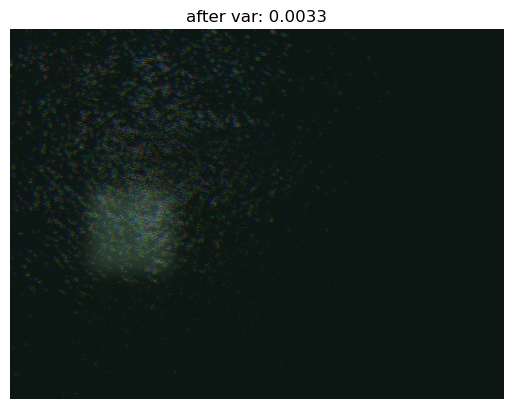

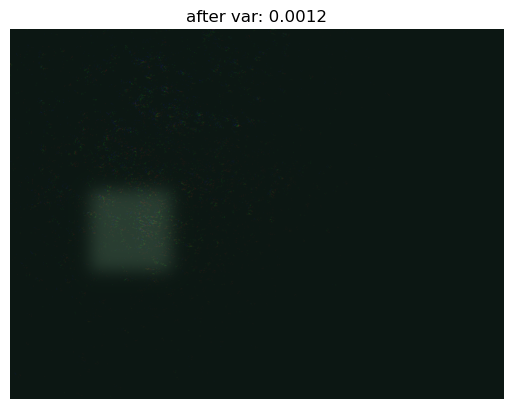

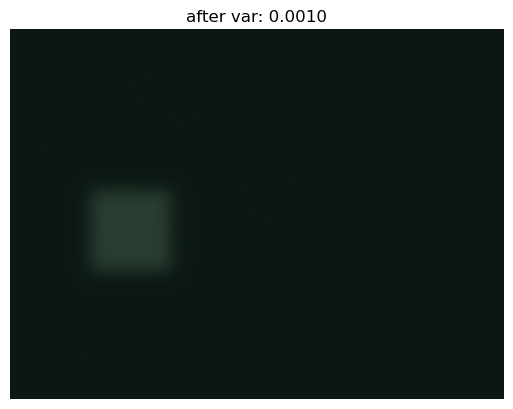

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


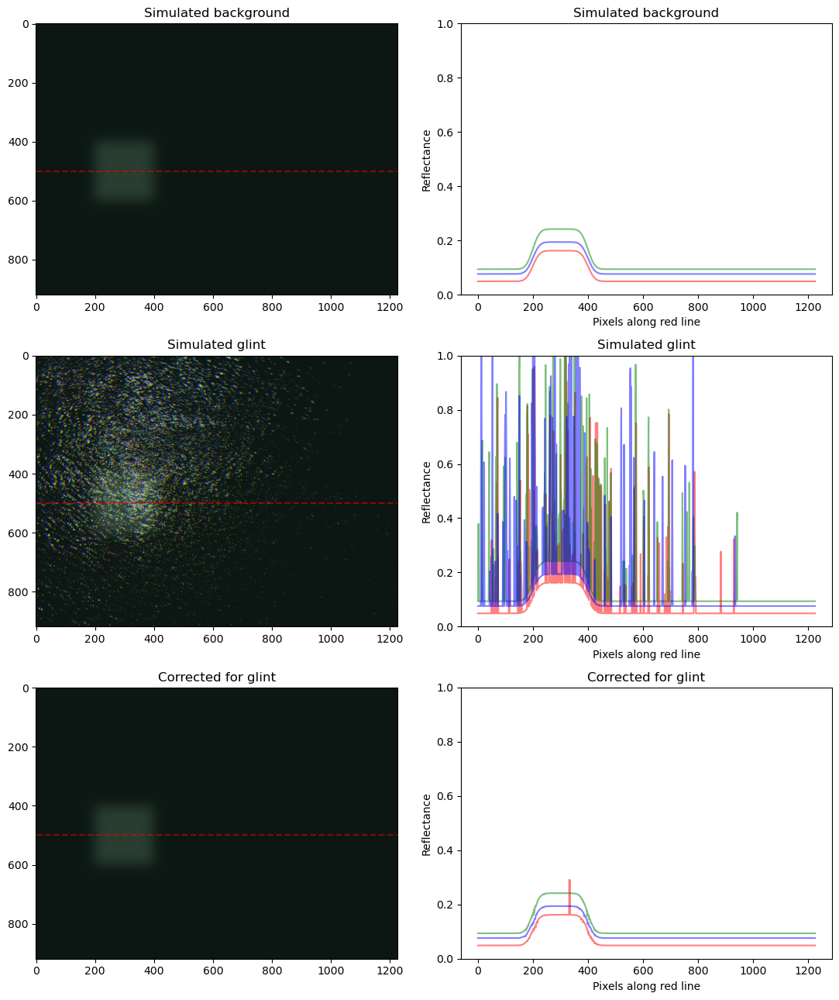

In [13]:
SB = ValidateAlgo.SimulateBackground(background_fp = r"database_turbid\turbid-10thSur24Aug_F1_RawImg_IMG_0043_1.ob",
                                     turbid_fp=r"database_water\water_glint-8thSur11Aug_F3_RawImg_IMG_0198_1.ob",
                                     glint_fp=r"database_glint\example.ob",
                                     bboxes_list=[((200,400),(400,600))],
                                     estimate_background = True,
                                     y_line = 500,x_range=None)
im_list_background = SB.simulation()

## Framework for evaluating glint correction on simulated images

In [14]:
glint_mask = mutils.load_pickle(r"database_glint\example.ob")

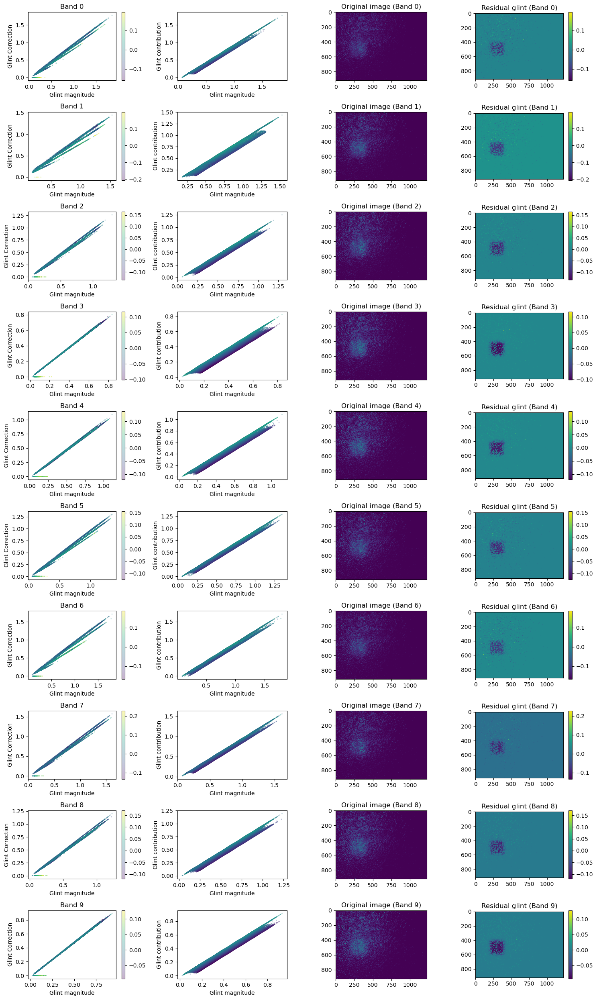

In [15]:
VA = ValidateAlgo.EvaluateCorrection(glint_im=im_list['Simulated glint'],
                                    corrected_glint=im_list['Corrected for glint'],
                                    no_glint=im_list['Simulated background'],
                                    glint_mask=glint_mask)
VA.glint_vs_corrected()

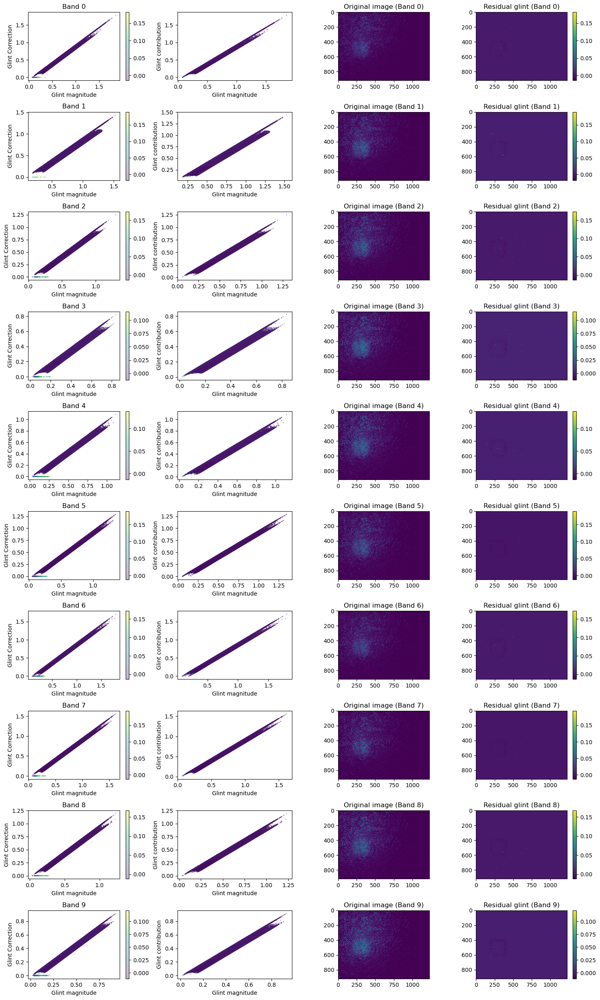

In [16]:
VA = ValidateAlgo.EvaluateCorrection(glint_im=im_list_background['Simulated glint'],
                                    corrected_glint=im_list_background['Corrected for glint'],
                                    no_glint=im_list_background['Simulated background'],
                                    glint_mask=glint_mask)
VA.glint_vs_corrected()

# Conduct SUGAR on UAV imagery

In [17]:
image_fp = r"example_images\10thSur24Aug_F2\IMG_0192_1.tif"
cap = mutils.import_captures(image_fp)
RI = espect.ReflectanceImage(cap)
im_aligned = RI.get_aligned_reflectance()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


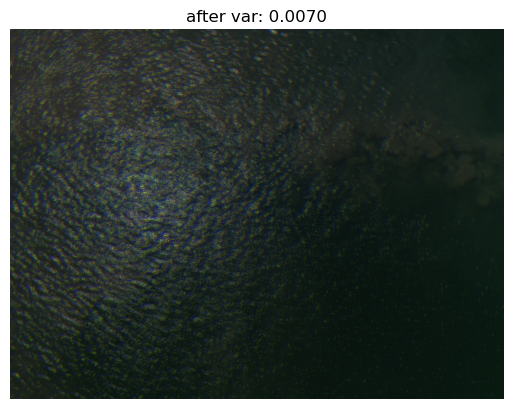

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


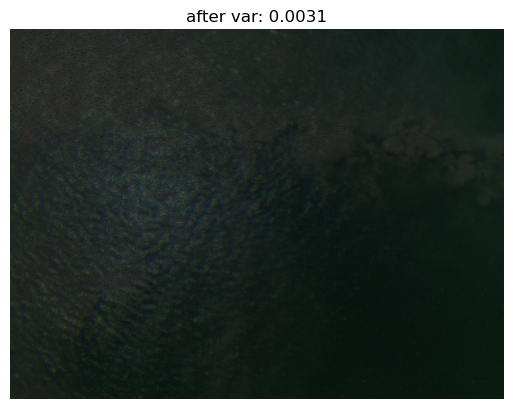

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


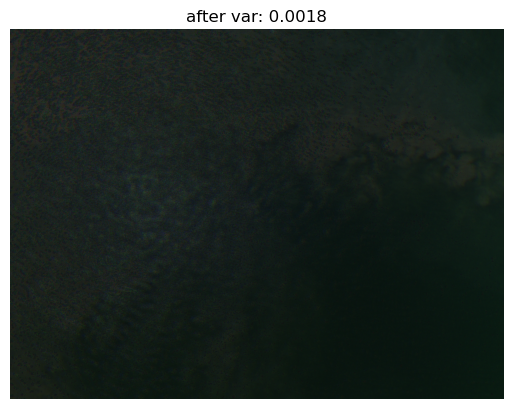

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


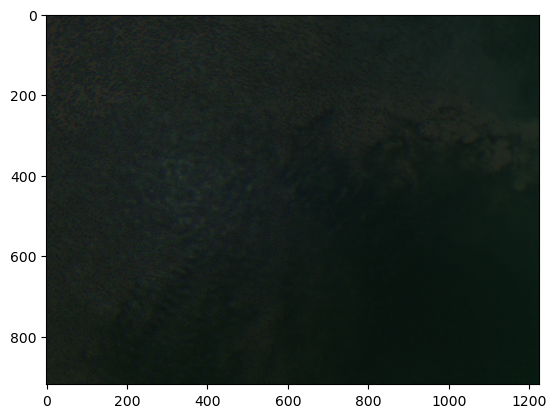

In [18]:
corrected_bands = sugar.correction_iterative(im_aligned,iter=3,estimate_background=False)
plt.figure()
plt.imshow(np.take(corrected_bands,[2,1,0],axis=2))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


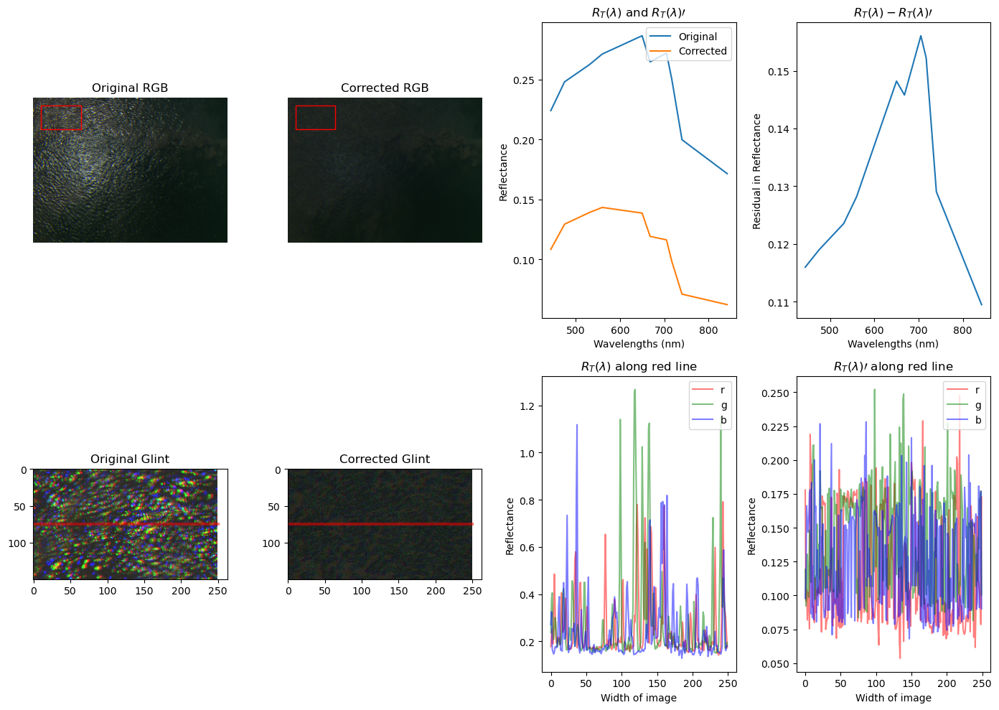

In [19]:
VA = ValidateAlgo.EvaluateCorrection(im_aligned,corrected_bands)
VA.correction_stats([(50,50),(300,200)])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


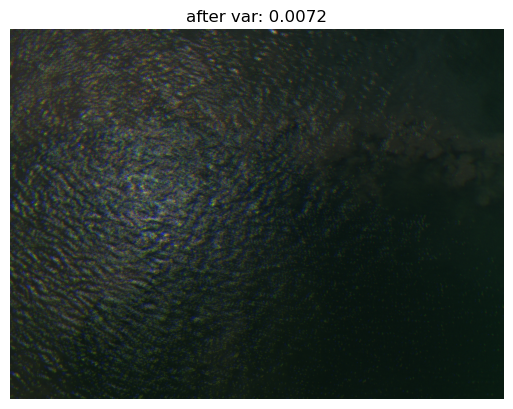

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


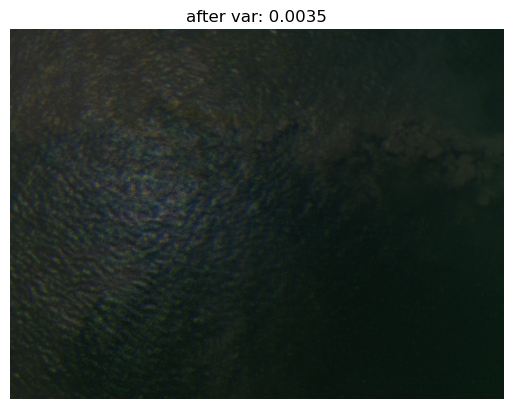

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


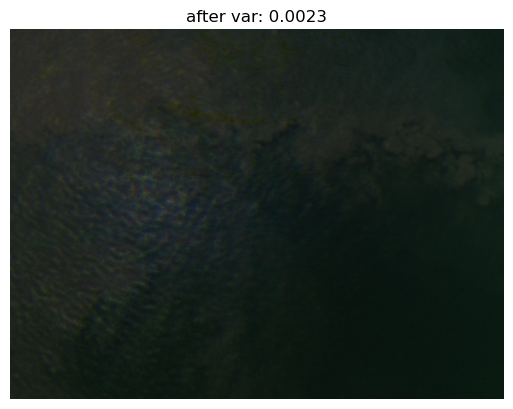

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


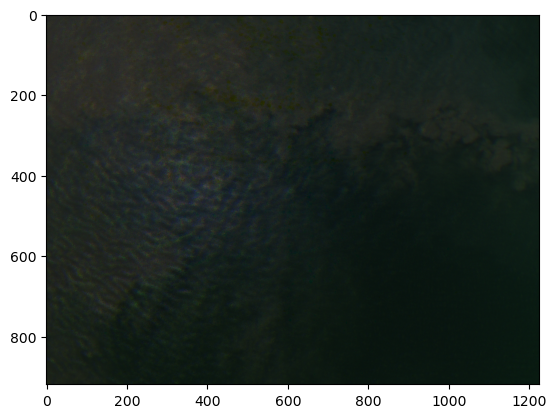

In [20]:
corrected_bands_background = sugar.correction_iterative(im_aligned,iter=3,estimate_background=True)
plt.figure()
plt.imshow(np.take(corrected_bands_background,[2,1,0],axis=2))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


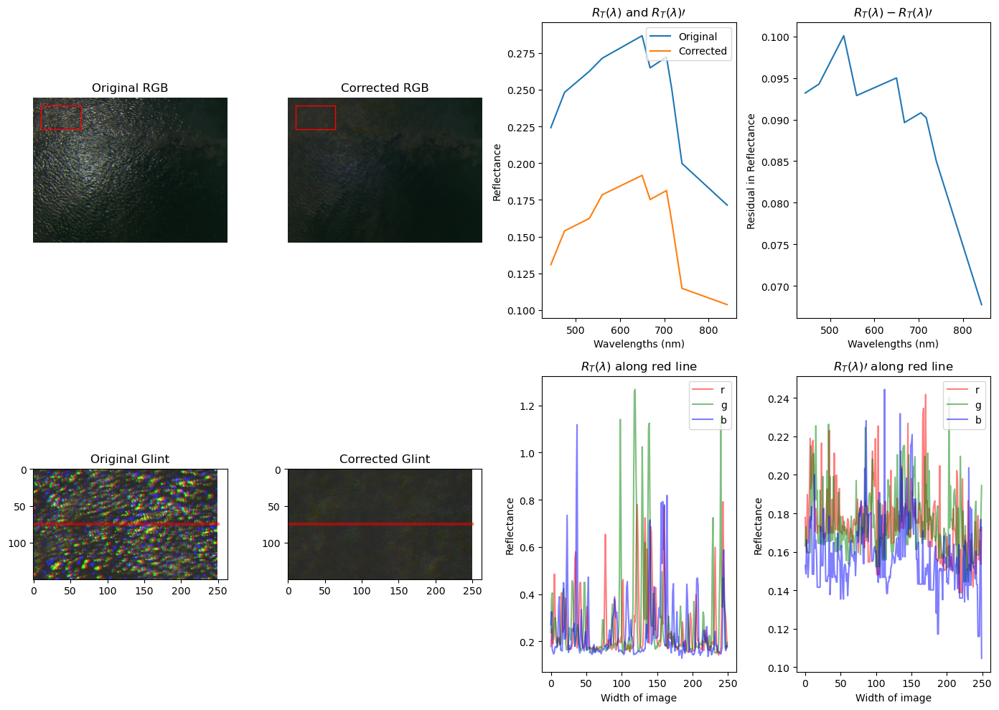

In [21]:
VA = ValidateAlgo.EvaluateCorrection(im_aligned,corrected_bands_background)
VA.correction_stats([(50,50),(300,200)])

  0%|          | 0/7 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


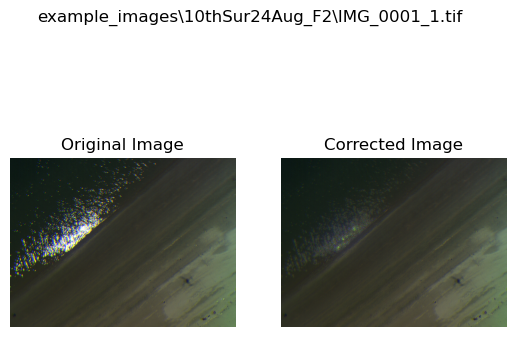

 14%|█▍        | 1/7 [02:07<12:42, 127.12s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


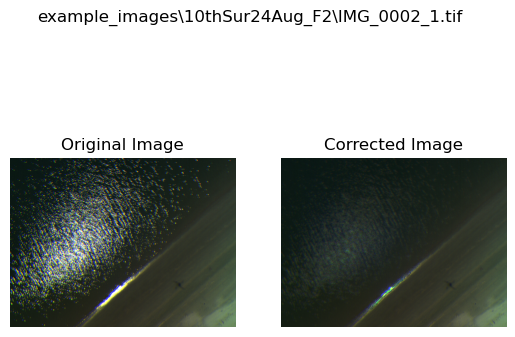

 29%|██▊       | 2/7 [04:29<11:20, 136.06s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


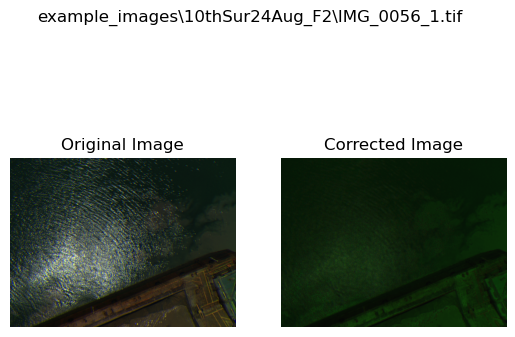

 43%|████▎     | 3/7 [06:51<09:15, 138.85s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


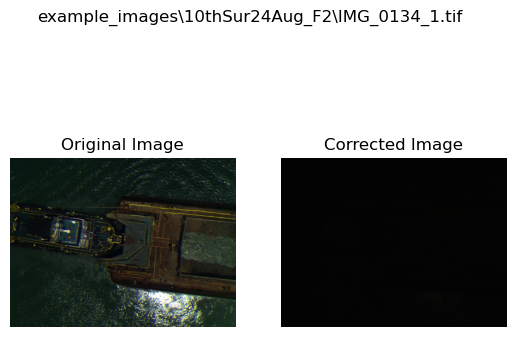

 57%|█████▋    | 4/7 [09:13<06:59, 139.95s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


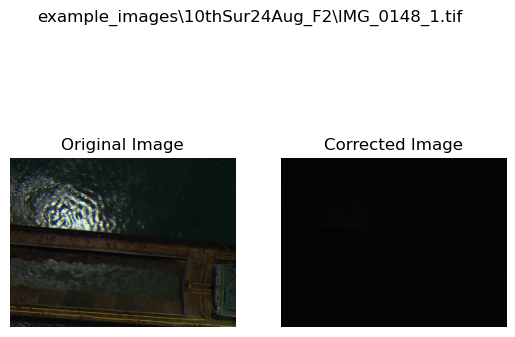

 71%|███████▏  | 5/7 [11:32<04:39, 139.59s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


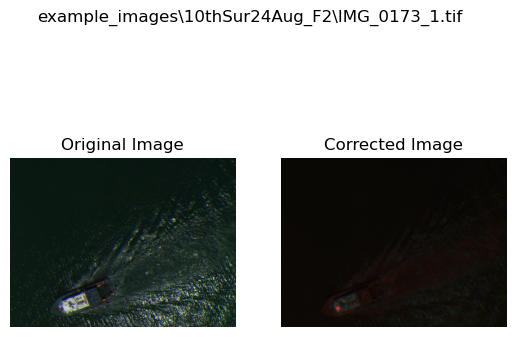

 86%|████████▌ | 6/7 [14:00<02:22, 142.44s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


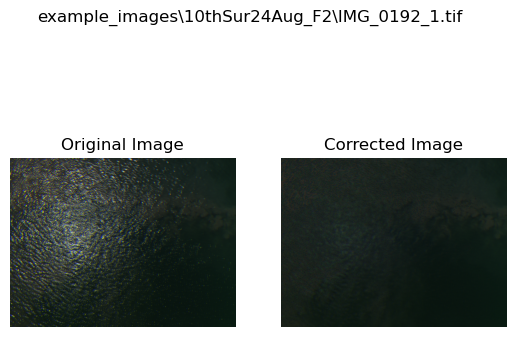

100%|██████████| 7/7 [16:33<00:00, 141.94s/it]


In [2]:
parent_dir = r"example_images\10thSur24Aug_F2"
fp_list = [os.path.join(parent_dir,fp) for fp in os.listdir(parent_dir) if fp.endswith("_1.tif")]
for fp in tqdm.tqdm(fp_list):
    cap = mutils.import_captures(fp)
    RI = espect.ReflectanceImage(cap)
    im_aligned = RI.get_aligned_reflectance()
    corrected_bands = sugar.correction_iterative(im_aligned,iter=3,estimate_background=False)
    fig, axes = plt.subplots(1,2)
    axes[0].imshow(np.take(im_aligned,[2,1,0],axis=2))
    axes[0].set_title('Original Image')
    axes[1].imshow(np.take(corrected_bands,[2,1,0],axis=2))
    axes[1].set_title('Corrected Image')
    for ax in axes:
        ax.axis('off')
    fig.suptitle(fp)
    plt.show()

In [3]:
cap = mutils.import_captures(fp_list[2])
RI = espect.ReflectanceImage(cap)
im_aligned = RI.get_aligned_reflectance()
corrected_bands = sugar.correction_iterative(im_aligned,plot=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


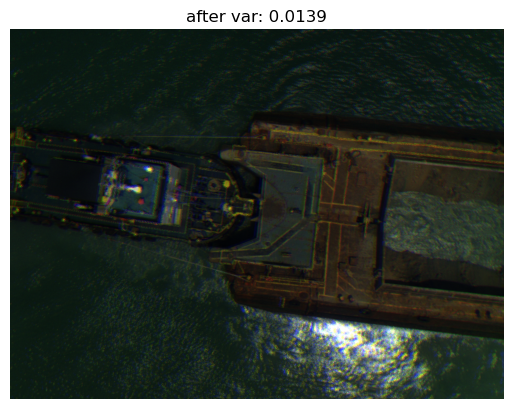

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


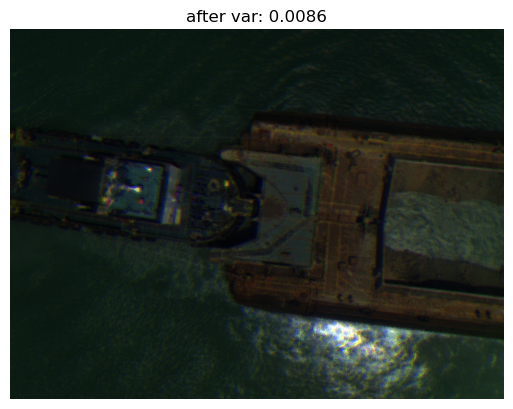

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


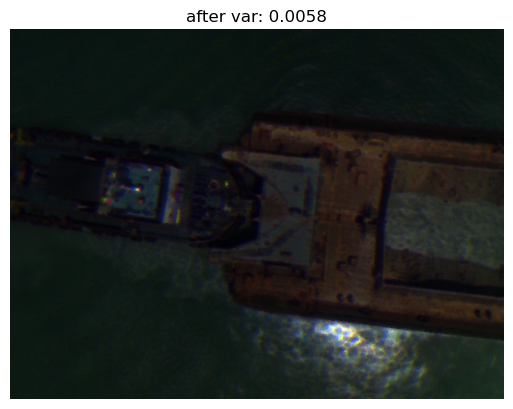

In [5]:
cap = mutils.import_captures(fp_list[3])
RI = espect.ReflectanceImage(cap)
im_aligned = RI.get_aligned_reflectance()
corrected_bands = sugar.correction_iterative(im_aligned,plot=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


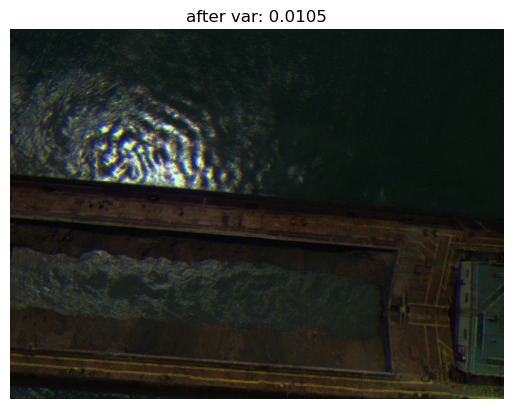

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


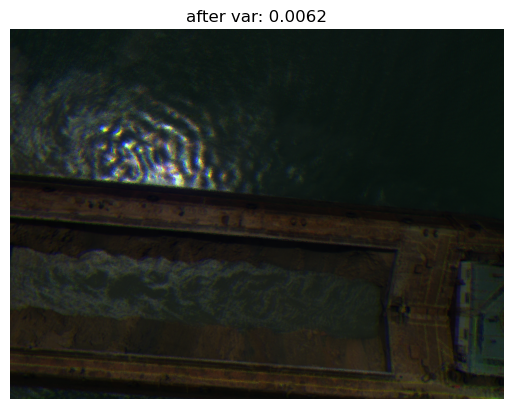

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


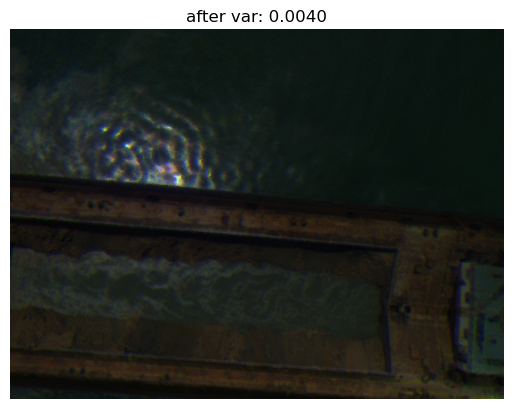

In [6]:
cap = mutils.import_captures(fp_list[4])
RI = espect.ReflectanceImage(cap)
im_aligned = RI.get_aligned_reflectance()
corrected_bands = sugar.correction_iterative(im_aligned,plot=True)

In [ ]:
cap = mutils.import_captures(fp_list[5])
RI = espect.ReflectanceImage(cap)
im_aligned = RI.get_aligned_reflectance()
corrected_bands = sugar.correction_iterative(im_aligned,plot=True)

# Uncertainties

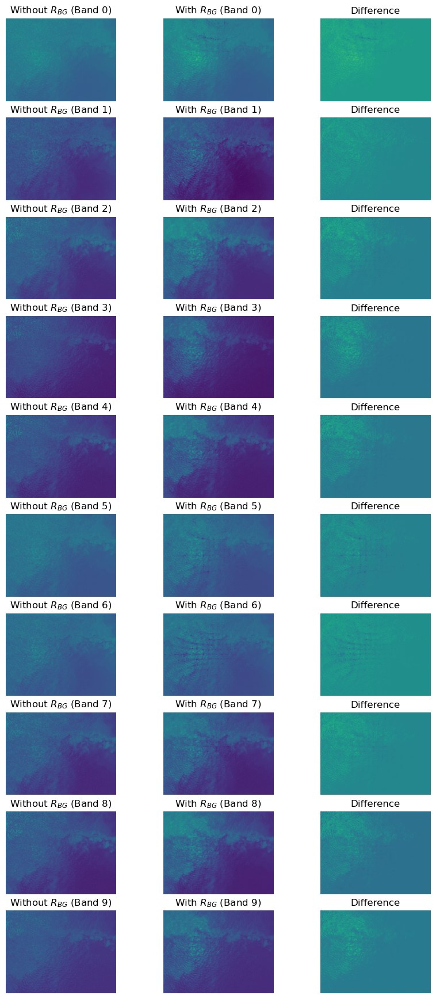

In [22]:
def correction_uncertainties(corrected_bands,corrected_bands_background):
    fig, axes = plt.subplots(corrected_bands.shape[-1],3,figsize=(10,22))
    for i in range(corrected_bands.shape[-1]):
        axes[i,0].imshow(corrected_bands[:,:,i])
        axes[i,0].set_title('Without $R_{BG}$'+ f' (Band {i})')
        axes[i,1].imshow(corrected_bands_background[:,:,i])
        axes[i,1].set_title('With $R_{BG}$'+ f' (Band {i})')
        diff = corrected_bands_background[:,:,i] - corrected_bands[:,:,i] 
        axes[i,2].imshow(diff)
        axes[i,2].set_title('Difference')
    
    for ax in axes.flatten():
        ax.axis('off')
    plt.show()
    return

correction_uncertainties(corrected_bands,corrected_bands_background)

# Fine-tuning HedleyMulti

In [23]:
class HedleyMulti_modified:
    def __init__(self, im_aligned,bounds=[(1,2)]*10,sigma=1):
        """
        :param im_aligned (np.ndarray): band aligned and calibrated & corrected reflectance image
        :param bounds (a list of tuple): lower and upper bound for optimisation of b for each band
        :param sigma (float): smoothing sigma for LoG
        """
        self.im_aligned = im_aligned
        self.sigma = sigma
        self.bounds = bounds
        # import wavelengths for each band
        wavelengths = mutils.sort_bands_by_wavelength()
        self.wavelength_dict = {i[0]:i[1] for i in wavelengths}
        self.n_bands = im_aligned.shape[-1]
        self.NIR_band = list(self.wavelength_dict)[-1]
        self.R_min = np.percentile(self.im_aligned[:,:,self.NIR_band].flatten(),5,interpolation='nearest')

    def otsu_thresholding(self,im):
        """
        :param im (np.ndarray) of shape mxn
        otsu thresholding with Brent's minimisation of a univariate function
        returns the value of the threshold for input
        """
        # count,bin,_ = plt.hist(im.flatten(),bins='auto')
        auto_bins = int(0.005*im.shape[0]*im.shape[1])
        count,bin,_ = plt.hist(im.flatten(),bins=auto_bins)
        plt.close()
        
        hist_norm = count/count.sum() #normalised histogram
        Q = hist_norm.cumsum() # CDF function ranges from 0 to 1
        N = count.shape[0]
        bins = np.arange(N)
        
        def otsu_thresh(x):
            x = int(x)
            p1,p2 = np.hsplit(hist_norm,[x]) # probabilities
            q1,q2 = Q[x],Q[N-1]-Q[x] # cum sum of classes
            b1,b2 = np.hsplit(bins,[x]) # weights
            # finding means and variances
            m1,m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
            v1,v2 = np.sum(((b1-m1)**2)*p1)/q1,np.sum(((b2-m2)**2)*p2)/q2
            # calculates the minimization function
            fn = v1*q1 + v2*q2
            return fn
        
        # brent method is used to minimise an univariate function
        # bounded minimisation
        res = minimize_scalar(otsu_thresh, bounds=(1, N), method='bounded')
        thresh = bin[int(res.x)]
        
        return thresh

    def glint_list(self):
        """
        returns a list of np.ndarray, where each item is an extracted glint for each band based on get_glint_mask
        """
        glint_mask = self.glint_mask_list()
        extracted_glint_list = []
        for i in range(self.im_aligned.shape[-1]):
            gm = glint_mask[i]
            extracted_glint = gm*self.im_aligned[:,:,i]
            extracted_glint_list.append(extracted_glint)

        return extracted_glint_list
    
    def glint_mask_list(self):
        """
        get glint mask using laplacian of gaussian image. 
        returns a list of np.ndarray
        """
        # fig, axes = plt.subplots(10,2,figsize=(8,20))
        glint_mask_list = []
        # glint_threshold = []
        for i in range(self.im_aligned.shape[-1]):
            glint_mask = self.get_glint_mask(self.im_aligned[:,:,i])
            glint_mask_list.append(glint_mask)

        return glint_mask_list
    
    def get_glint_mask(self,im):
        """
        get glint mask using laplacian of gaussian image. 
        We assume that water constituents and features follow a smooth continuum, 
        but glint pixels vary a lot spatially and in intensities
        Note that for very extensive glint, this method may not work as well <--:TODO use U-net to identify glint mask
        returns a np.ndarray
        """
        # find the laplacian of gaussian first
        # take the absolute value of laplacian because the sign doesnt really matter, we want all edges
        # im_smooth = np.abs(ndimage.gaussian_laplace(im_copy,sigma=self.sigma))
        # im_smooth = im_smooth/np.max(im_smooth)
        im_smooth = ndimage.gaussian_laplace(im,sigma=self.sigma)
        #threshold mask
        thresh = self.otsu_thresholding(im_smooth)
        # glint_threshold.append(thresh)
        glint_mask = np.where(im_smooth<thresh,1,0)

        return glint_mask
    
    def get_est_background(self, im):
        """ 
        :param im (np.ndarray): image of a band
        estimate background spectra
        returns a np.ndarray
        """
        median_filtered_list = [im]
        for i in [5,10,20,30]:
            y = ndimage.median_filter(im, size=i)
            median_filtered_list.append(y)

        median_filtered_list = np.stack(median_filtered_list,axis=2)
        return np.amin(median_filtered_list,axis=2)

    def optimise_correction_by_band(self,im,glint_mask,R_BG,bounds):
        """
        :param im (np.ndarray): image of a band
        :param glint_mask (np.ndarray): glint mask, where glint area is 1 and non-glint area is 0
        use brent method to get the optimimum b which minimises the variation (i.e. variance) in the entire image
        returns regression slope b
        """
        hedley_c = lambda r,g,b,R_min: r - g*(r/b-R_min)
        # where R_min is the background spectra
        def optimise_b(b):
            G = glint_mask
            R = im
            # R_min = np.percentile(R,5,interpolation='nearest')
            # im_corrected = hedley_c(R,G,b,R_min)
            im_corrected = hedley_c(R,G,b,R_BG)
            # add an additional constraint to ensure global smoothness of image
            # using variance of laplacian
            # var_laplace = laplace(im_corrected).var()
            return np.var(im_corrected)#*var_laplace

        res = minimize_scalar(optimise_b, bounds=bounds, method='bounded')
        return res.x
    
    def divide_and_conquer(self):
        """
        instead of computing b_list for each window, use the previous b_list to narrow the bounds, 
        because of the strong spatial autocorrelation, we know that the b (correction magnitude) cannot diff too much
        this can optimise the run time
        """
        

    def optimise_correction(self):
        """ 
        returns a list of slope in band order i.e. 0,1,2,3,4,5,6,7,8,9 through optimisation
        """
        # glint_mask = self.get_glint_mask(plot=False)
        b_list = []
        glint_mask_list = []
        est_background_list = []
        for i in range(self.n_bands):
            glint_mask = self.get_glint_mask(self.im_aligned[:,:,i])
            glint_mask_list.append(glint_mask)
            est_background = self.get_est_background(self.im_aligned[:,:,i])
            est_background_list.append(est_background)
            bounds = self.bounds[i]
            b = self.optimise_correction_by_band(self.im_aligned[:,:,i],glint_mask,est_background,bounds)
            b_list.append(b)
        
        # add attribute
        self.b_list = b_list

        return b_list, glint_mask_list, est_background_list
    
    def get_corrected_bands(self,plot=False):
        """
        :param glint_normalisation (bool): whether to normalise/contrast stretch extracted glint by using histogram normalisation
        :param optimise_b (bool): whether to optimise b instead of calculating for b (default is True)
        use regression slopes to correct each bands
        returns a list of corrected bands in band order i.e. 0,1,2,3,4,5,6,7,8,9
        """
        
        b_list, glint_mask_list, est_background_list = self.optimise_correction()
        
        # where r=reflectance at pixel_i,
        # g= glint mask at pixel_i
        # b = regression slope
        # R_min = 5th percentile of Rmin(NIR)
        hedley_c = lambda r,g,b,R_min: r - g*(r/b-R_min)
        # hedley_c = lambda r,g,b: r - g*(r/b)

        corrected_bands = []
        # avg_reflectance = []
        # avg_reflectance_corrected = []

        # fig, axes = plt.subplots(self.n_bands,2,figsize=(10,20))
        for band_number in range(self.n_bands):
            b = b_list[band_number]
            R = self.im_aligned[:,:,band_number]
            G = glint_mask_list[band_number]
            R_BG = est_background_list[band_number]
            # corrected_band = hedley_c(R,G,b,self.R_min)
            # estimation of background spectra is important, 
            # and uncertainties is largely attribution to the estimation of background spectra
            
            corrected_band = hedley_c(R,G,b,R_BG)
            # corrected_band = hedley_c(R,G,b)
            corrected_bands.append(corrected_band)
        
        if plot is True:
            fig, axes = plt.subplots(self.n_bands,2,figsize=(10,20))
            for band_number in range(self.n_bands):
                axes[band_number,0].imshow(self.im_aligned[:,:,band_number],vmin=0,vmax=1)
                axes[band_number,1].imshow(corrected_bands[band_number],vmin=0,vmax=1)
                axes[band_number,0].set_title(f'Band {self.wavelength_dict[band_number]} reflectance')
                axes[band_number,1].set_title(f'Band {self.wavelength_dict[band_number]} reflectance corrected')
        
            for ax in axes.flatten():
                ax.axis('off')
            plt.tight_layout()
            plt.show()

        return corrected_bands

    def correction_stats(self,bbox):
        """
        :param bbox (tuple): ((x1,y1),(x2,y2)), where x1,y1 is the upper left corner, x2,y2 is the lower right corner
        Show corrected and original rgb image, mean reflectance
        """
        ((x1,y1),(x2,y2)) = bbox
        corrected_bands = self.get_corrected_bands(plot=False)
        rgb_bands = [2,1,0]

        fig, axes = plt.subplots(2,4,figsize=(14,10))
        #non-corrected images and reflectance for bbox
        rgb_im = np.take(self.im_aligned,rgb_bands,axis=2)
        glint_area = self.im_aligned[y1:y2,x1:x2,:]
        avg_reflectance = [np.mean(glint_area[:,:,band_number]) for band_number in range(self.n_bands)]
        
        #corrected images and reflectance for bbox
        rgb_im_corrected = np.stack([corrected_bands[i] for i in rgb_bands],axis=2)
        avg_reflectance_corrected = [np.mean(corrected_bands[band_number][y1:y2,x1:x2]) for band_number in range(self.n_bands)]
        
        # plot original rgb
        axes[0,0].imshow(rgb_im)
        axes[0,0].set_title('Original RGB')
        coord, w, h = mutils.bboxes_to_patches(bbox)
        rect = patches.Rectangle(coord, w, h, linewidth=1, edgecolor='red', facecolor='none')
        axes[0,0].add_patch(rect)
        # plot corrected rgb
        axes[0,1].imshow(rgb_im_corrected)
        axes[0,1].set_title('Corrected RGB')
        rect = patches.Rectangle(coord, w, h, linewidth=1, edgecolor='red', facecolor='none')
        axes[0,1].add_patch(rect)
        # reflectance
        axes[0,2].plot(list(self.wavelength_dict.values()),[avg_reflectance[i] for i in list(self.wavelength_dict)], label='Original')
        axes[0,2].plot(list(self.wavelength_dict.values()),[avg_reflectance_corrected[i] for i in list(self.wavelength_dict)], label='Corrected')
        axes[0,2].set_xlabel('Wavelengths (nm)')
        axes[0,2].set_ylabel('Reflectance')
        axes[0,2].legend(loc='upper right')
        axes[0,2].set_title('Corrected and original mean reflectance')

        residual = [og-cor for og,cor in zip(avg_reflectance,avg_reflectance_corrected)]
        axes[0,3].plot(list(self.wavelength_dict.values()),[residual[i] for i in list(self.wavelength_dict)])
        axes[0,3].set_xlabel('Wavelengths (nm)')
        axes[0,3].set_ylabel('Residual in Reflectance')

        for ax in axes[0,:2]:
            ax.axis('off')
        
        h = y2 - y1
        w = x2 - x1

        axes[1,0].imshow(rgb_im[y1:y2,x1:x2,:])
        axes[1,1].imshow(rgb_im_corrected[y1:y2,x1:x2,:])
        axes[1,0].set_title('Original Glint')
        axes[1,1].set_title('Corrected Glint')

        axes[1,0].plot([0,h],[h//2,h//2],color="red",linewidth=3)
        axes[1,1].plot([0,h],[h//2,h//2],color="red",linewidth=3)
        
        # for ax in axes[1,0:2]:
        #     ax.axis('off')

        for i,c in zip(range(3),['r','g','b']):
            axes[1,2].plot(list(range(w)),rgb_im[y1:y2,x1:x2,:][h//2,:,i],c=c)
            # plot for original
        for i,c in zip(range(3),['r','g','b']):
            # plot for corrected reflectance
            axes[1,2].plot(list(range(w)),rgb_im_corrected[y1:y2,x1:x2,:][h//2,:,i],c=c,ls='--')

        axes[1,2].set_xlabel('Width of image')
        axes[1,2].set_ylabel('Reflectance')
        axes[1,2].set_title('Reflectance along red line')

        residual = rgb_im[y1:y2,x1:x2,:][h//2,:,:] - rgb_im_corrected[y1:y2,x1:x2,:][h//2,:,:]
        for i,c in zip(range(3),['r','g','b']):
            axes[1,3].plot(list(range(w)),residual[:,i],c=c)

        axes[1,3].set_xlabel('Width of image')
        axes[1,3].set_ylabel('Residual in Reflectance')
        axes[1,3].set_title('Reflectance along red line')

        plt.tight_layout()
        plt.show()

        return
    
    def compare_image(self,save_dir=None, filename = None, plot = True):
        """
        :param save_dir (str): specify directory to store image in. If it is None, no image is saved
        :param filename (str): filename of image u want to save e.g. 'D:\\EPMC_flight\\10thSur24Aug\\F2\\RawImg\\IMG_0192_1.tif'
        returns a figure where left figure is original image, and right figure is corrected image
        """
        corrected_bands = self.get_corrected_bands(plot=False)
        corrected_im = np.stack([corrected_bands[i] for i in [2,1,0]],axis=2)
        original_im = np.take(self.im_aligned,[2,1,0],axis=2)
        fig, axes = plt.subplots(1,2,figsize=(12,7))
        axes[0].imshow(original_im)
        axes[0].set_title('Original Image')
        axes[1].imshow(corrected_im)
        axes[1].set_title('Corrected Image')
        for ax in axes:
            ax.axis('off')
        plt.tight_layout()

        if save_dir is not None:
            save_dir = os.path.join(save_dir,"corrected_images")
            if not os.path.exists(save_dir):
                os.mkdir(save_dir)

            filename = mutils.get_all_dir(filename,iter=4)
            filename = os.path.splitext(filename)[0]
            full_fn = os.path.join(save_dir,filename)

            fig.suptitle(filename)
            fig.savefig('{}.png'.format(full_fn))

        if plot is True:
            plt.show()
        else:
            plt.close()
        return

# Estimating $R_{BG}(\lambda)$

estimating background spectrum to fine tune the over/undercorrection for turbid regions

## Medium filter

In [24]:
def median_filter(im_aligned):
    
    fig, axes = plt.subplots(im_aligned.shape[-1],2,figsize=(12,20))
    est_background = []
    for band_number in range(im_aligned.shape[-1]):
        x_list = []
        for i in [5,10,20,30]:
            y = ndimage.median_filter(im_aligned[:,:,band_number], size=i)
            x_list.append(y)
        
        x_list = np.stack(x_list,axis=2)
        dst = np.amin(x_list,axis=2)
        est_background.append(dst)
        axes[band_number,0].imshow(im_aligned[:,:,band_number])
        axes[band_number,1].imshow(dst)
    plt.show()

    plt.figure()
    plt.imshow(np.stack([est_background[i] for i in [2,1,0]],axis=2))
    plt.show()
    return est_background

## Inpainting

In [25]:
def inpainting(im_aligned,close=True):
    HM = HedleyMulti_modified(im_aligned)
    glint_mask_list = HM.glint_mask_list()
    est_background = []
    fig, axes = plt.subplots(len(glint_mask_list),2,figsize=(12,20))
    for i in range(len(glint_mask_list)):
        mask = glint_mask_list[i].astype(np.uint8)
        if close is True:
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
            mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        dst = cv2.inpaint(im_aligned[:,:,i],mask,3,cv2.INPAINT_TELEA)
        est_background.append(dst)
        axes[i,0].imshow(im_aligned[:,:,i],vmin=0,vmax=1)
        axes[i,1].imshow(dst,vmin=0,vmax=1)
    plt.show()

    plt.figure()
    plt.imshow(np.stack([est_background[i] for i in [2,1,0]],axis=2))
    plt.show()
    
    return est_background

## Morphological operations

In [26]:
def morphological(im_aligned,k_size=5):
    # HM = HedleyMulti_modified(im_aligned)
    # glint_mask_list = HM.glint_mask_list()
    fig, axes = plt.subplots(im_aligned.shape[-1],2,figsize=(12,20))
    est_background = []
    for i in range(im_aligned.shape[-1]):
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(k_size,k_size))
        # dst = cv2.morphologyEx(im_aligned[:,:,i], cv2.MORPH_OPEN, kernel)
        dst = cv2.erode(im_aligned[:,:,i], kernel)
        est_background.append(dst)
        axes[i,0].imshow(im_aligned[:,:,i],vmin=0,vmax=1)
        axes[i,1].imshow(dst,vmin=0,vmax=1)
    plt.show()

    plt.figure()
    plt.imshow(np.stack([est_background[i] for i in [2,1,0]],axis=2))
    plt.show()
    
    return est_background

## FFT

In [27]:
from scipy import fftpack

def fft(im_aligned,keep_fraction=0.4):
    fig, axes = plt.subplots(im_aligned.shape[-1],2,figsize=(12,20))
    est_background = []
    for i in range(im_aligned.shape[-1]):
        im_fft = fftpack.fft2(im_aligned)
        # In the lines following, we'll make a copy of the original spectrum and
        # truncate coefficients.
        # Define the fraction of coefficients (in each direction) we keep
        # Call ff a copy of the original transform. Numpy arrays have a copy
        # method for this purpose.
        im_fft2 = im_fft.copy()
        # Set r and c to be the number of rows and columns of the array.
        r, c = im_fft2.shape
        # Set to zero all rows with indices between r*keep_fraction and
        # r*(1-keep_fraction):
        im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
        # Similarly with the columns:
        im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
        # Reconstruct the denoised image from the filtered spectrum, keep only the
        # real part for display.
        im_new = fftpack.ifft2(im_fft2).real
        est_background.append(im_new)

    plt.figure()
    plt.imshow(np.stack([est_background[i] for i in [2,1,0]],axis=2))
    plt.show()
    
    return est_background

https://scikit-learn.org/stable/auto_examples/neighbors/plot_species_kde.html#sphx-glr-auto-examples-neighbors-plot-species-kde-py